Сореванования Kaggle - https://www.kaggle.com/competitions/leopard-challenge-classification/leaderboard

Задача классификации. В данном проекте необходимо найди курильщиков по клиническим показаниям.
Метрика F1.

### 1. Импорты и загрухка данных.

In [1]:
!pip install phik shap lightgbm optuna osmnx kaggle -q

In [74]:
import seaborn as sns
import numpy as np
import os
import zipfile
import pandas as pd
import plotly.graph_objects as go
import phik
import osmnx as ox
import plotly.express as px
import lightgbm as lgb
import optuna
import shap
import matplotlib.pyplot as plt

from sklearn.pipeline import Pipeline, make_pipeline, FeatureUnion
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate, StratifiedKFold
from optuna.samplers import TPESampler
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, PolynomialFeatures
from sklearn.feature_selection import SelectKBest, f_regression, SelectFromModel
from sklearn.metrics import make_scorer, f1_score, roc_auc_score, confusion_matrix, classification_report
from sklearn.ensemble import VotingClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

In [75]:
os.environ['KAGGLE_CONFIG_DIR'] = r'C:\Users\solov'

In [76]:
!kaggle competitions download -c leopard-challenge-classification

leopard-challenge-classification.zip: Skipping, found more recently modified local copy (use --force to force download)


In [77]:
with zipfile.ZipFile('leopard-challenge-classification.zip', 'r') as zip_ref:
    zip_ref.extractall('data')

In [78]:
df = pd.read_csv('data/train.csv')

In [79]:
test = pd.read_csv('data/test.csv')

In [80]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13863 entries, 0 to 13862
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   13863 non-null  int64  
 1   age                  13863 non-null  int64  
 2   height(cm)           13863 non-null  int64  
 3   weight(kg)           13863 non-null  int64  
 4   waist(cm)            13863 non-null  float64
 5   eyesight(left)       13863 non-null  float64
 6   eyesight(right)      13863 non-null  float64
 7   hearing(left)        13863 non-null  float64
 8   hearing(right)       13863 non-null  float64
 9   systolic             13863 non-null  float64
 10  relaxation           13863 non-null  float64
 11  fasting blood sugar  13863 non-null  float64
 12  Cholesterol          13863 non-null  float64
 13  triglyceride         13863 non-null  float64
 14  HDL                  13863 non-null  float64
 15  LDL                  13863 non-null 

In [81]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5942 entries, 0 to 5941
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   5942 non-null   int64  
 1   age                  5942 non-null   int64  
 2   height(cm)           5942 non-null   int64  
 3   weight(kg)           5942 non-null   int64  
 4   waist(cm)            5942 non-null   float64
 5   eyesight(left)       5942 non-null   float64
 6   eyesight(right)      5942 non-null   float64
 7   hearing(left)        5942 non-null   float64
 8   hearing(right)       5942 non-null   float64
 9   systolic             5942 non-null   float64
 10  relaxation           5942 non-null   float64
 11  fasting blood sugar  5942 non-null   float64
 12  Cholesterol          5942 non-null   float64
 13  triglyceride         5942 non-null   float64
 14  HDL                  5942 non-null   float64
 15  LDL                  5942 non-null   f

Данных не много, все загрузки и импорты без ошибок. 

### 2. EDA

In [82]:
def check_df(df):
    missing_percentage = df.isnull().mean() * 100
    print('Процент пропусков по столбцам:')
    print(missing_percentage)
    duplicate_count = df.duplicated().sum()
    print('\nКоличество дубликатов в DF:', duplicate_count)

In [83]:
check_df(df)

Процент пропусков по столбцам:
ID                     0.0
age                    0.0
height(cm)             0.0
weight(kg)             0.0
waist(cm)              0.0
eyesight(left)         0.0
eyesight(right)        0.0
hearing(left)          0.0
hearing(right)         0.0
systolic               0.0
relaxation             0.0
fasting blood sugar    0.0
Cholesterol            0.0
triglyceride           0.0
HDL                    0.0
LDL                    0.0
hemoglobin             0.0
Urine protein          0.0
serum creatinine       0.0
AST                    0.0
ALT                    0.0
Gtp                    0.0
oral                   0.0
dental caries          0.0
tartar                 0.0
smoking                0.0
dtype: float64

Количество дубликатов в DF: 0


In [84]:
check_df(test)

Процент пропусков по столбцам:
ID                     0.0
age                    0.0
height(cm)             0.0
weight(kg)             0.0
waist(cm)              0.0
eyesight(left)         0.0
eyesight(right)        0.0
hearing(left)          0.0
hearing(right)         0.0
systolic               0.0
relaxation             0.0
fasting blood sugar    0.0
Cholesterol            0.0
triglyceride           0.0
HDL                    0.0
LDL                    0.0
hemoglobin             0.0
Urine protein          0.0
serum creatinine       0.0
AST                    0.0
ALT                    0.0
Gtp                    0.0
oral                   0.0
dental caries          0.0
tartar                 0.0
dtype: float64

Количество дубликатов в DF: 0


Отлично! Пропусков нет, дальше статистический анализ.

In [85]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ID,13863.0,NaN,NaN,NaN,9932.891654,5715.739532,1.0,4985.5,9956.0,14865.5,19804.0
age,13863.0,NaN,NaN,NaN,41.743851,13.624383,20.0,30.0,40.0,50.0,85.0
height(cm),13863.0,NaN,NaN,NaN,169.618409,6.493959,145.0,165.0,170.0,175.0,190.0
weight(kg),13863.0,NaN,NaN,NaN,71.270288,11.195751,40.0,65.0,70.0,80.0,130.0
waist(cm),13863.0,NaN,NaN,NaN,84.870627,8.194957,51.0,79.2,84.4,90.0,128.0
eyesight(left),13863.0,NaN,NaN,NaN,1.057304,0.514618,0.1,0.8,1.0,1.2,9.9
eyesight(right),13863.0,NaN,NaN,NaN,1.05374,0.514613,0.1,0.8,1.0,1.2,9.9
hearing(left),13863.0,NaN,NaN,NaN,1.02806,0.165151,1.0,1.0,1.0,1.0,2.0
hearing(right),13863.0,NaN,NaN,NaN,1.027411,0.163284,1.0,1.0,1.0,1.0,2.0
systolic,13863.0,NaN,NaN,NaN,123.430643,12.964684,74.0,115.0,122.0,131.0,240.0


In [86]:
test.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ID,5942.0,NaN,NaN,NaN,9829.928139,5720.956022,0.0,4878.0,9764.5,14831.75,19801.0
age,5942.0,NaN,NaN,NaN,41.411982,13.858116,20.0,30.0,40.0,50.0,85.0
height(cm),5942.0,NaN,NaN,NaN,169.77617,6.440753,145.0,165.0,170.0,175.0,190.0
weight(kg),5942.0,NaN,NaN,NaN,71.475093,11.228569,40.0,65.0,70.0,80.0,130.0
waist(cm),5942.0,NaN,NaN,NaN,84.916139,8.163827,51.0,79.2,85.0,90.0,121.0
eyesight(left),5942.0,NaN,NaN,NaN,1.064692,0.56183,0.1,0.8,1.0,1.2,9.9
eyesight(right),5942.0,NaN,NaN,NaN,1.047442,0.474787,0.1,0.8,1.0,1.2,9.9
hearing(left),5942.0,NaN,NaN,NaN,1.026927,0.161884,1.0,1.0,1.0,1.0,2.0
hearing(right),5942.0,NaN,NaN,NaN,1.025076,0.156368,1.0,1.0,1.0,1.0,2.0
systolic,5942.0,NaN,NaN,NaN,123.299562,12.792169,85.0,115.0,122.0,131.0,199.0


Все антропометрические значения и возраст - соотвествуют логике. Медицинские признаки сложно анализировать без экспертного мнения, насколько я углубился в теорию - все показатели очень индивидуальны и зависят от множества факторов, точное определение и характеристику сможет дать только квалифицированнай специалист. 

In [87]:
def analyze_df(df):
    for column in df.columns:
        if df[column].dtype == 'object':
            unique_values = df[column].nunique()
            print(f"Количество уникальных значений в столбце '{column}': {unique_values}")
            print(f"Уникальные значения в столбце '{column}':")
            print(df[column].unique())

            fig = px.histogram(df, x=column, title=f"Распределение {column}")
            fig.show()
        else:
            q1 = df[column].quantile(0.25)
            q3 = df[column].quantile(0.75)
            iqr = q3 - q1
            lower_bound = q1 - 1.5 * iqr
            upper_bound = q3 + 1.5 * iqr
            outliers_count = ((df[column] < lower_bound) | (df[column] > upper_bound)).sum()
            print(f"Количество строк с выбросами в столбце '{column}': {outliers_count}")
            
            fig_histogram = px.histogram(df, x=column, title=f"Распреление {column}")
            fig_histogram.show()

Количество строк с выбросами в столбце 'ID': 0


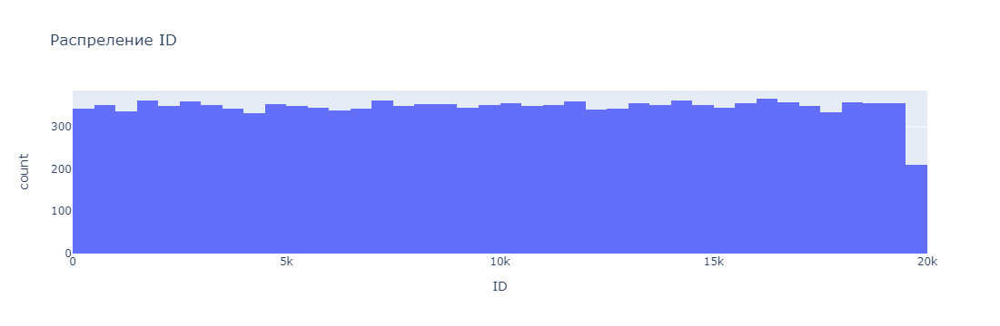

Количество строк с выбросами в столбце 'age': 8


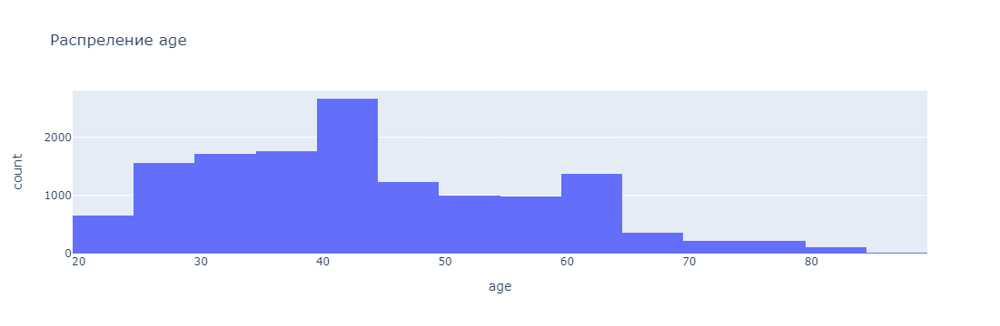

Количество строк с выбросами в столбце 'height(cm)': 2


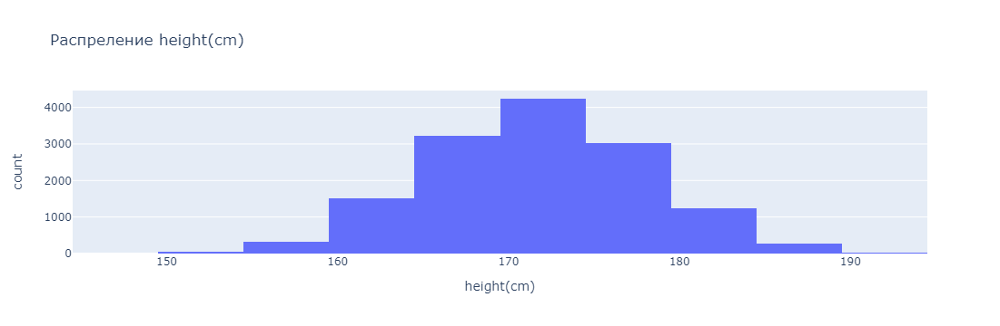

Количество строк с выбросами в столбце 'weight(kg)': 148


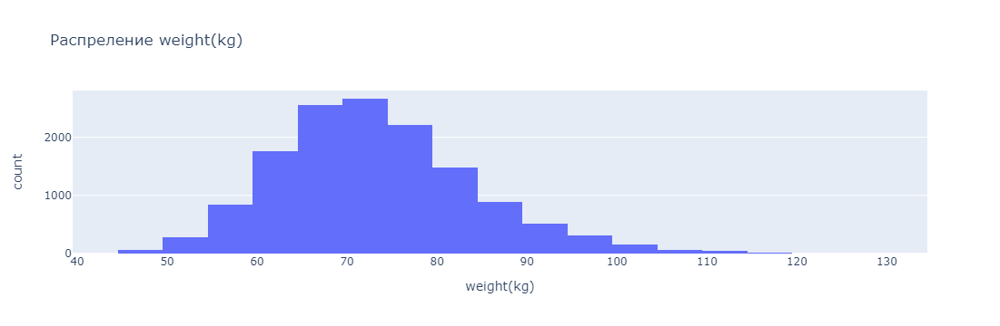

Количество строк с выбросами в столбце 'waist(cm)': 187


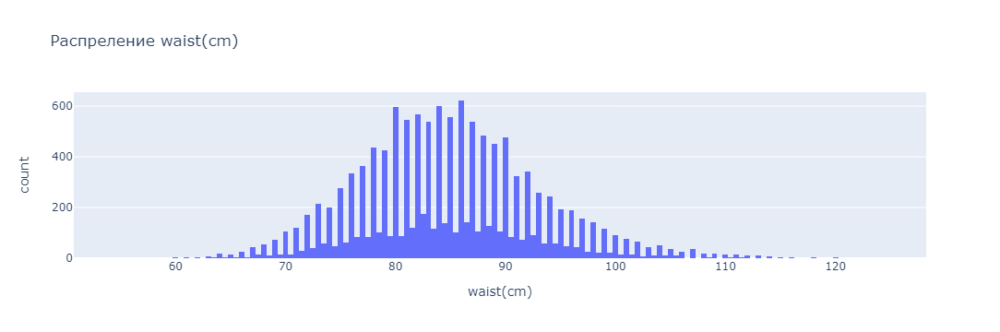

Количество строк с выбросами в столбце 'eyesight(left)': 345


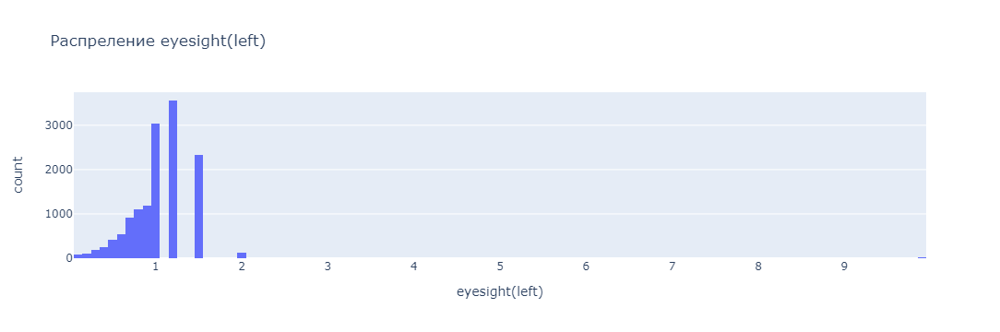

Количество строк с выбросами в столбце 'eyesight(right)': 345


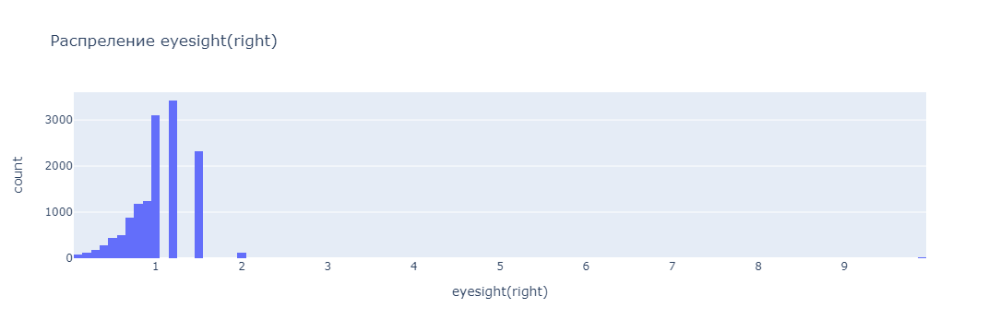

Количество строк с выбросами в столбце 'hearing(left)': 389


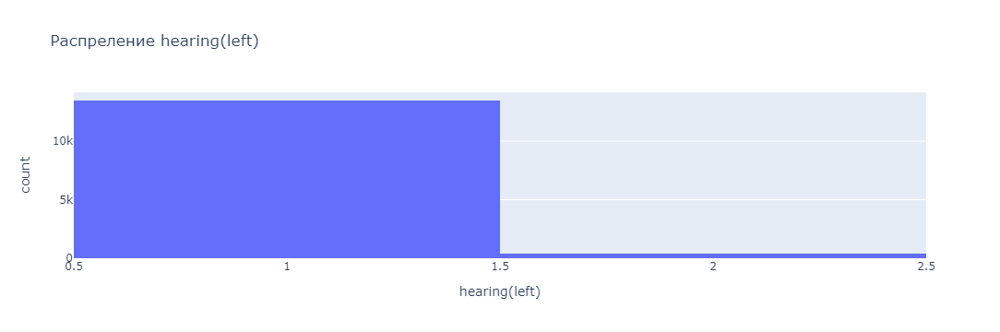

Количество строк с выбросами в столбце 'hearing(right)': 380


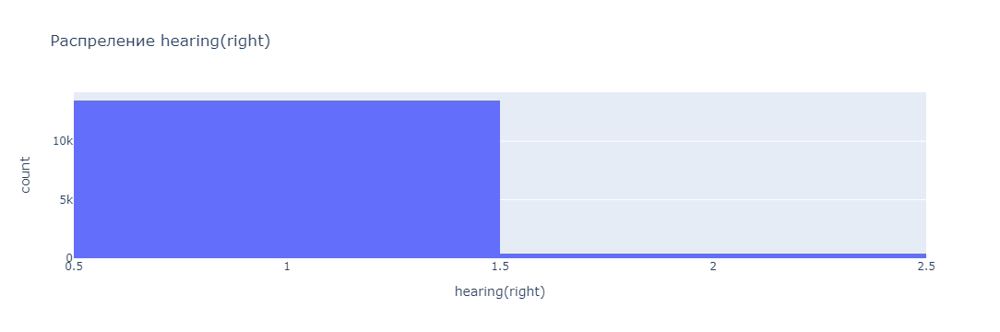

Количество строк с выбросами в столбце 'systolic': 240


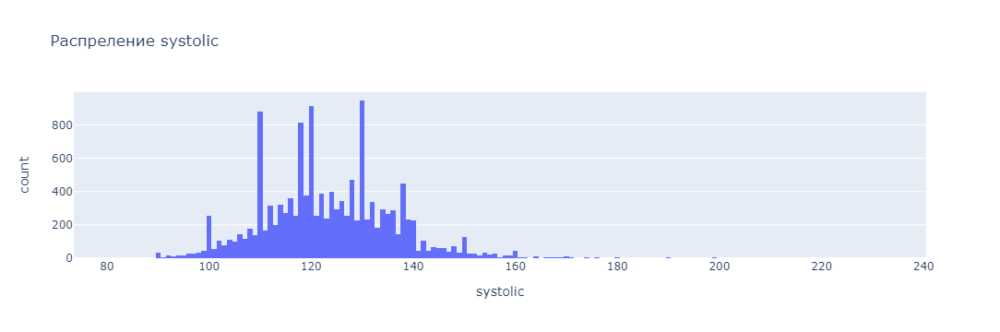

Количество строк с выбросами в столбце 'relaxation': 125


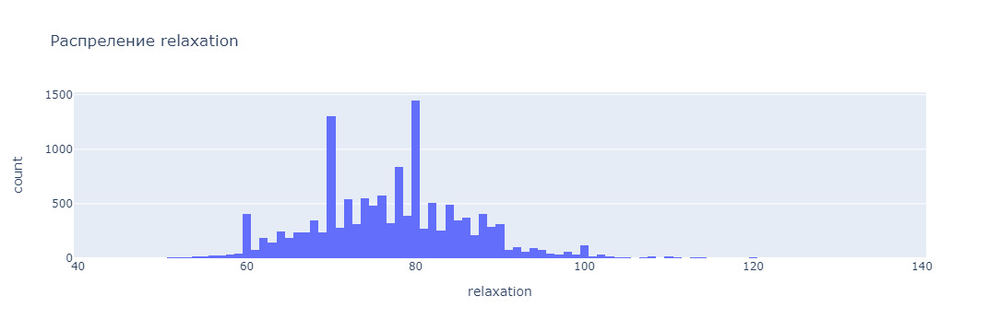

Количество строк с выбросами в столбце 'fasting blood sugar': 901


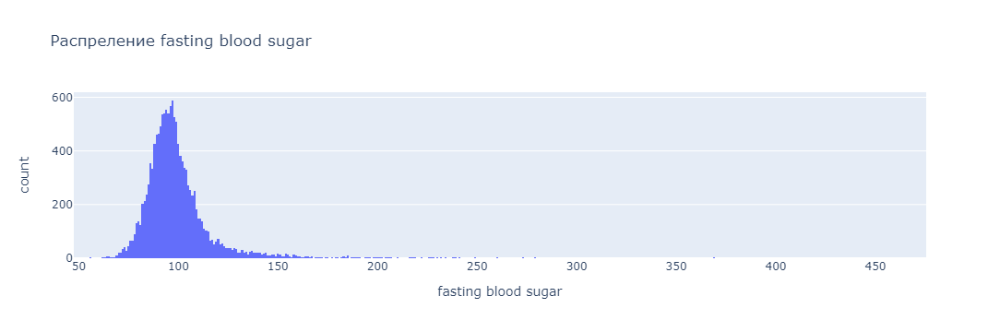

Количество строк с выбросами в столбце 'Cholesterol': 157


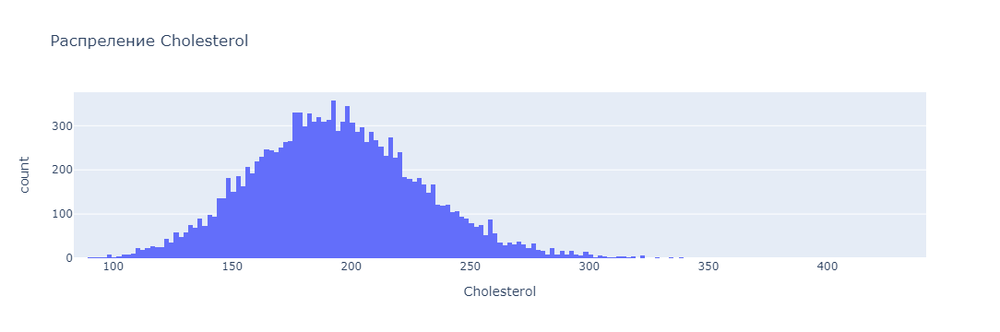

Количество строк с выбросами в столбце 'triglyceride': 499


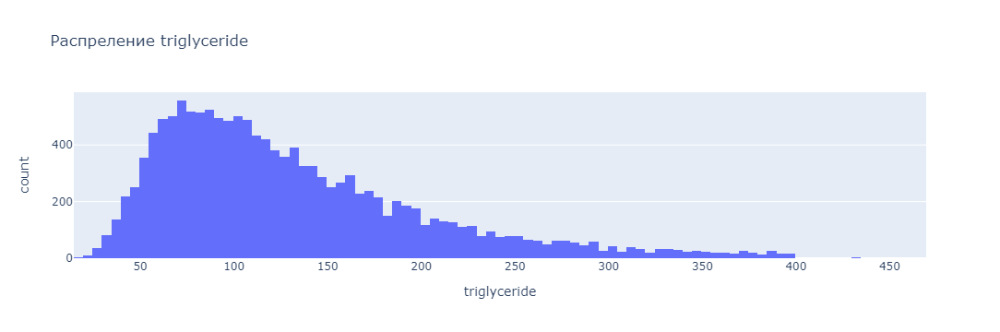

Количество строк с выбросами в столбце 'HDL': 307


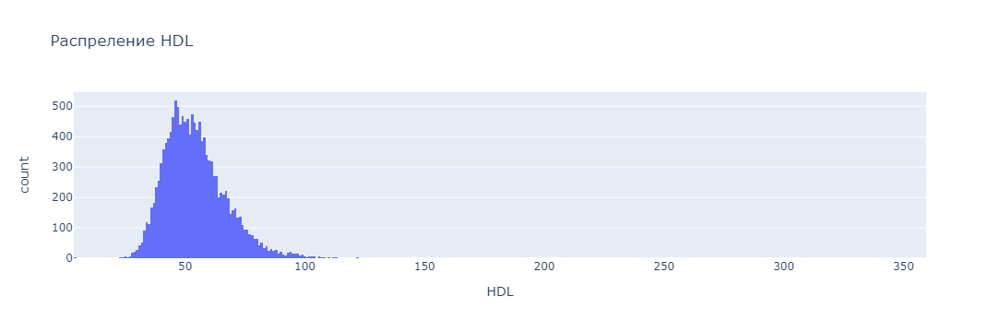

Количество строк с выбросами в столбце 'LDL': 134


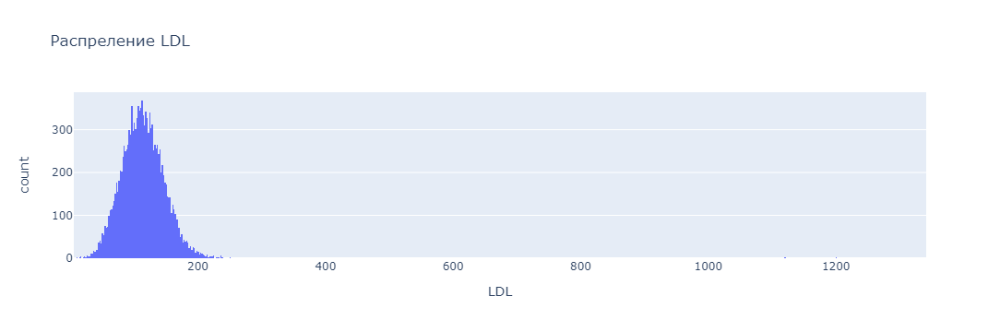

Количество строк с выбросами в столбце 'hemoglobin': 242


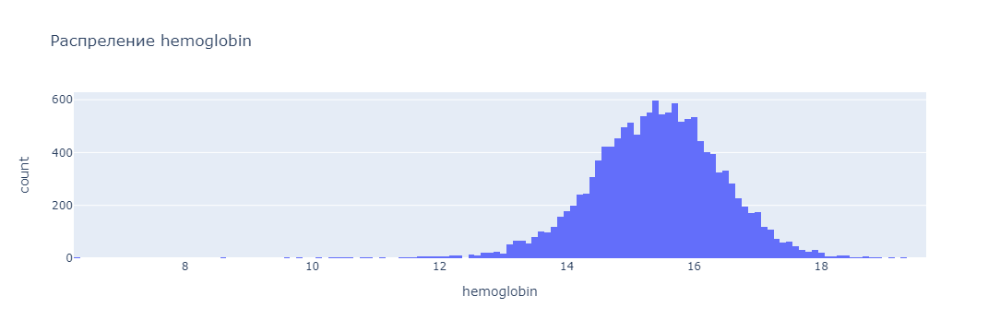

Количество строк с выбросами в столбце 'Urine protein': 836


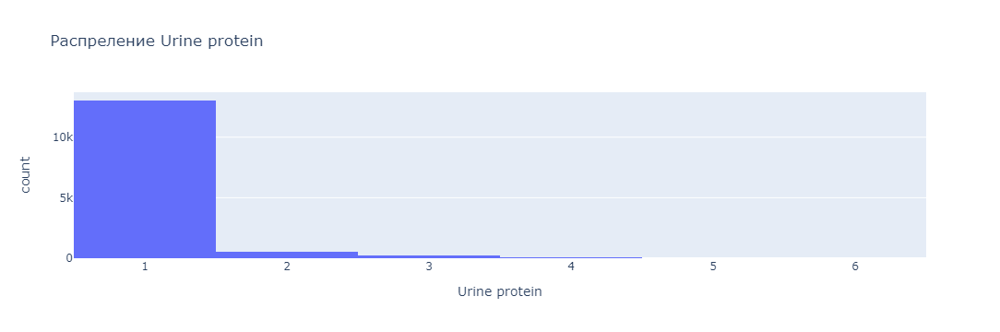

Количество строк с выбросами в столбце 'serum creatinine': 144


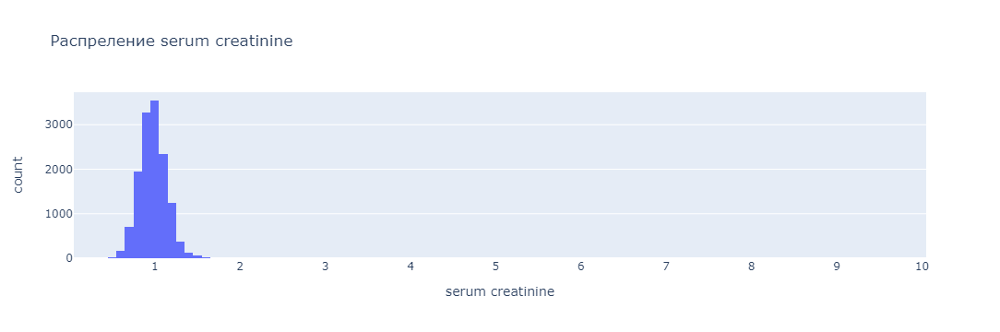

Количество строк с выбросами в столбце 'AST': 831


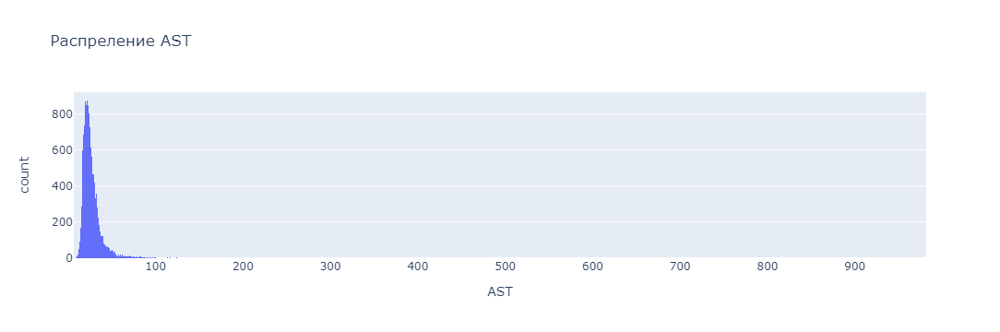

Количество строк с выбросами в столбце 'ALT': 985


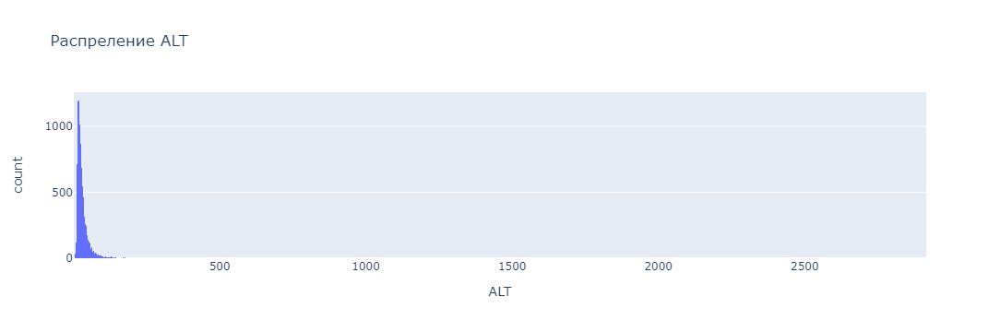

Количество строк с выбросами в столбце 'Gtp': 1164


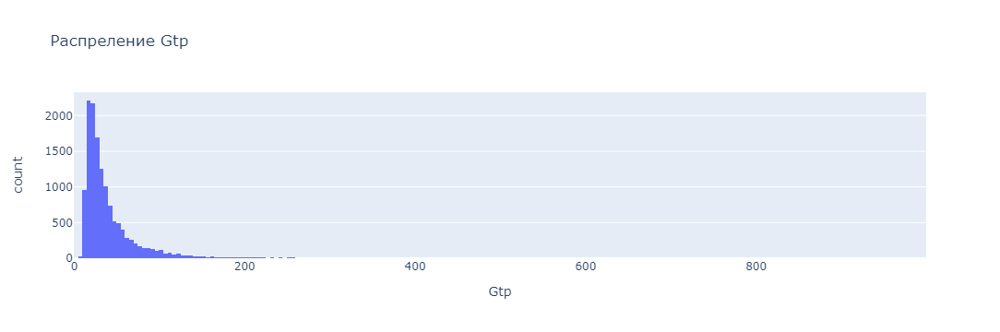

Количество уникальных значений в столбце 'oral': 1
Уникальные значения в столбце 'oral':
['Y']


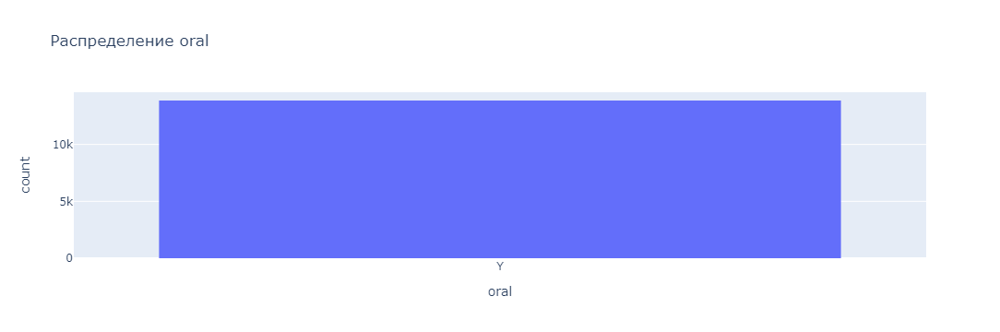

Количество строк с выбросами в столбце 'dental caries': 2940


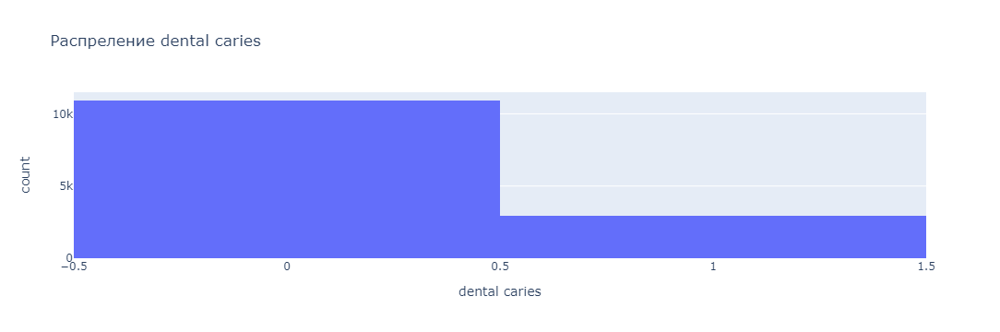

Количество уникальных значений в столбце 'tartar': 2
Уникальные значения в столбце 'tartar':
['N' 'Y']


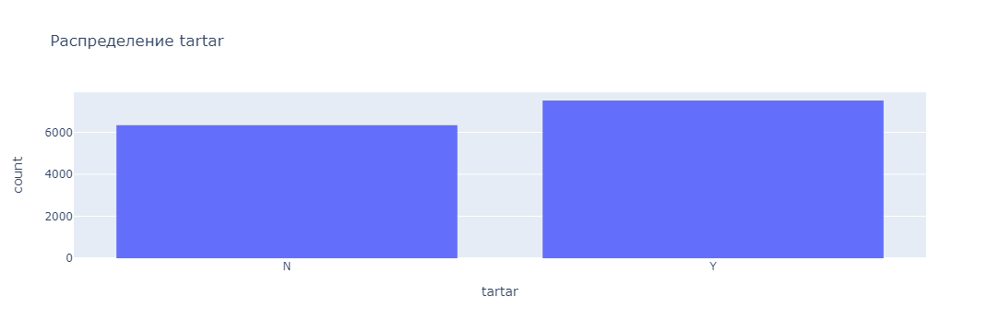

Количество строк с выбросами в столбце 'smoking': 2800


In [88]:
analyze_df(df)

Количество строк с выбросами в столбце 'ID': 0


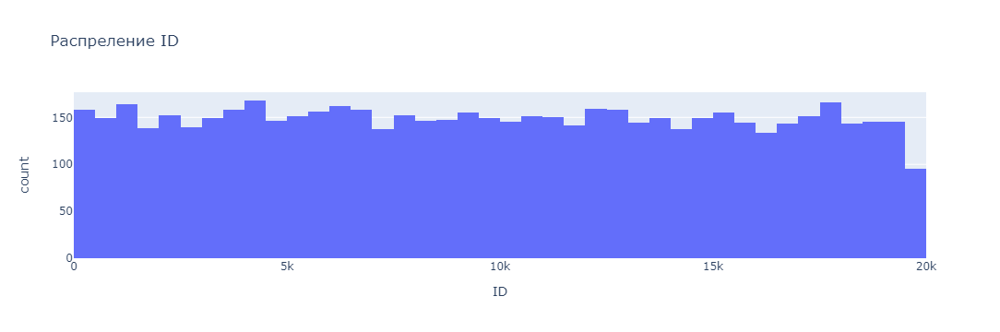

Количество строк с выбросами в столбце 'age': 4


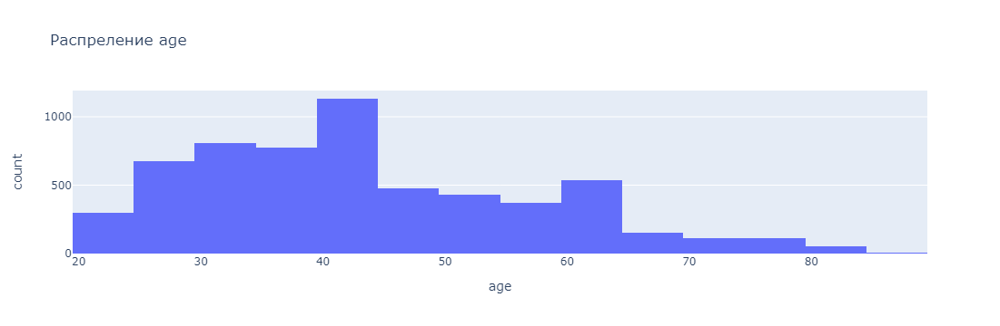

Количество строк с выбросами в столбце 'height(cm)': 1


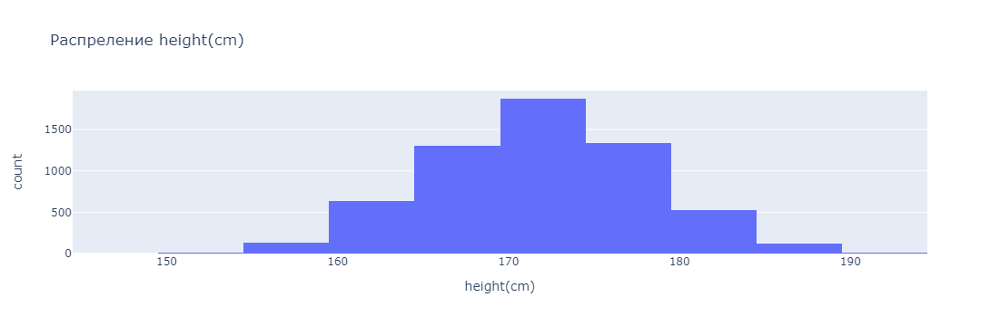

Количество строк с выбросами в столбце 'weight(kg)': 67


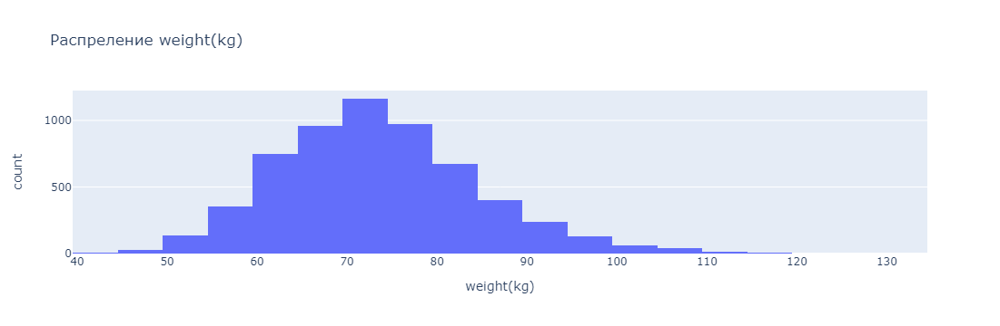

Количество строк с выбросами в столбце 'waist(cm)': 62


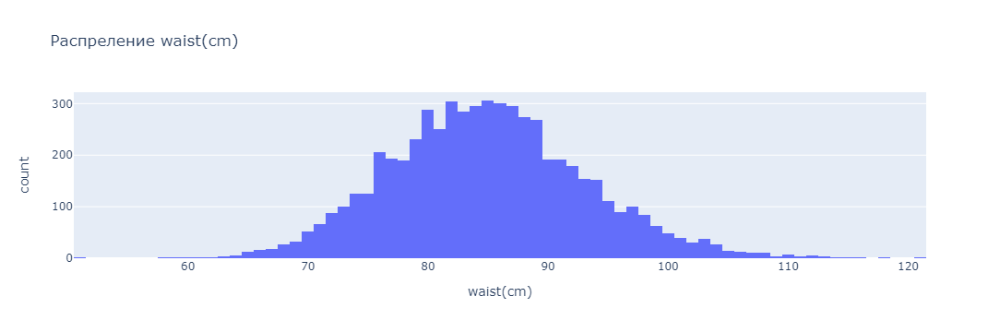

Количество строк с выбросами в столбце 'eyesight(left)': 141


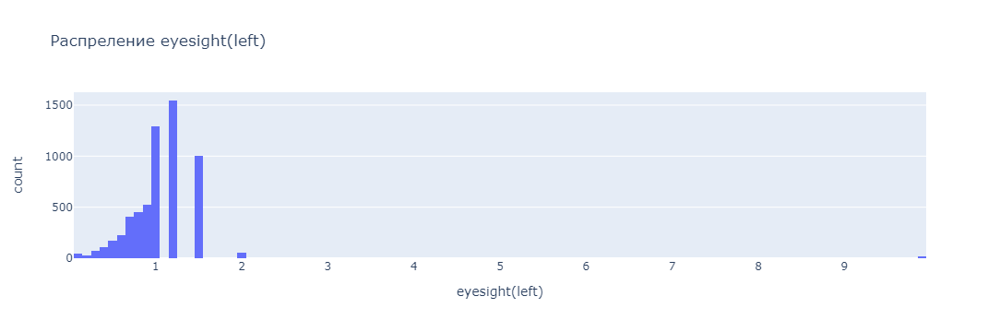

Количество строк с выбросами в столбце 'eyesight(right)': 146


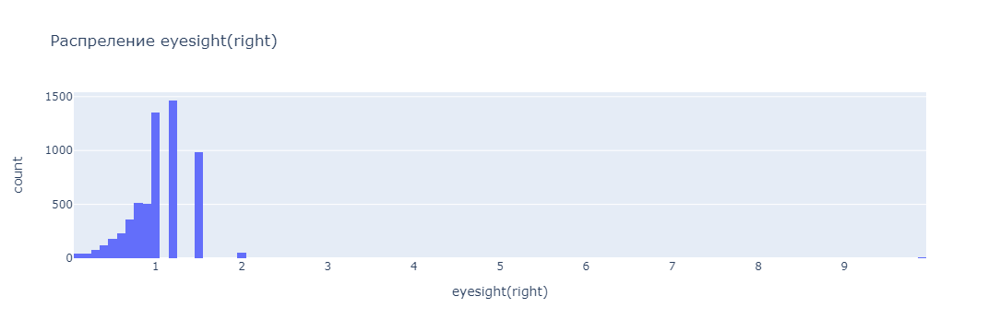

Количество строк с выбросами в столбце 'hearing(left)': 160


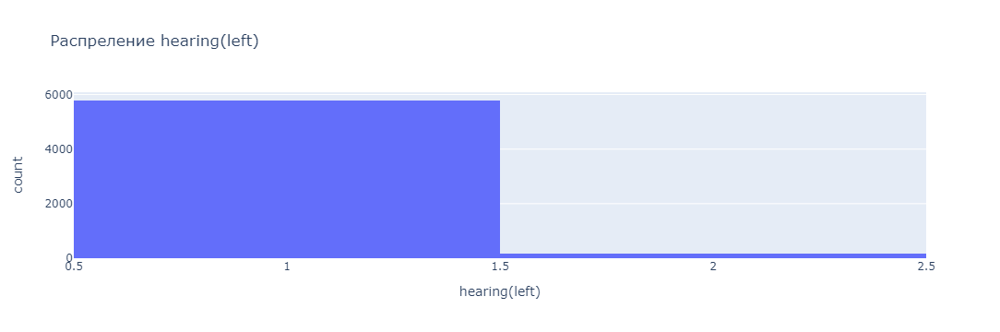

Количество строк с выбросами в столбце 'hearing(right)': 149


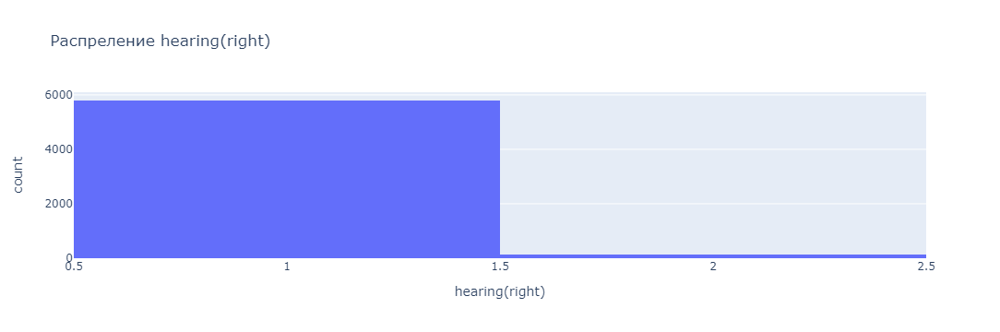

Количество строк с выбросами в столбце 'systolic': 103


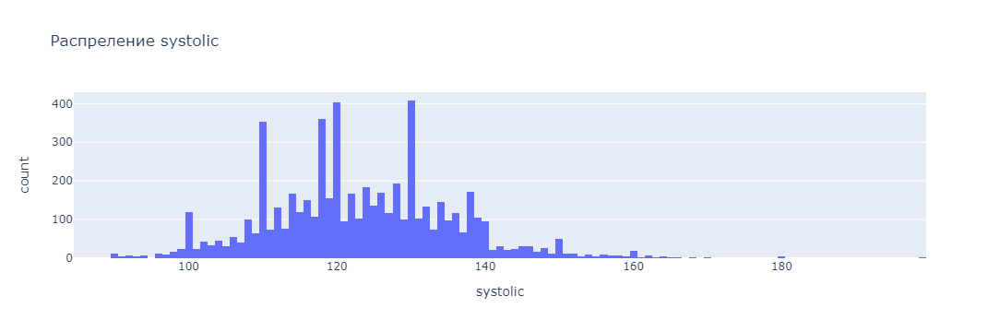

Количество строк с выбросами в столбце 'relaxation': 62


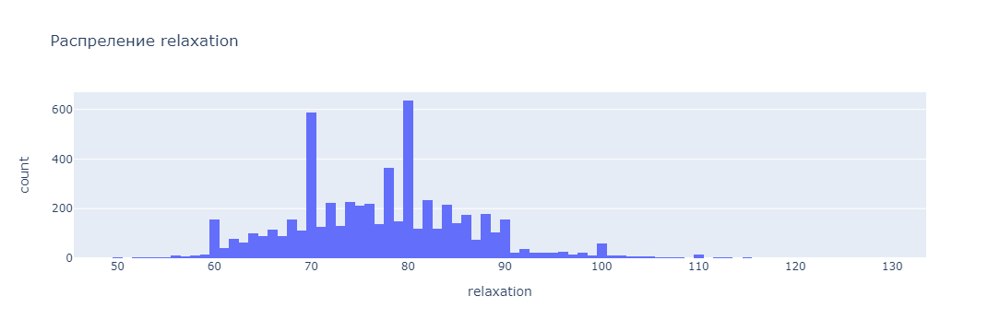

Количество строк с выбросами в столбце 'fasting blood sugar': 353


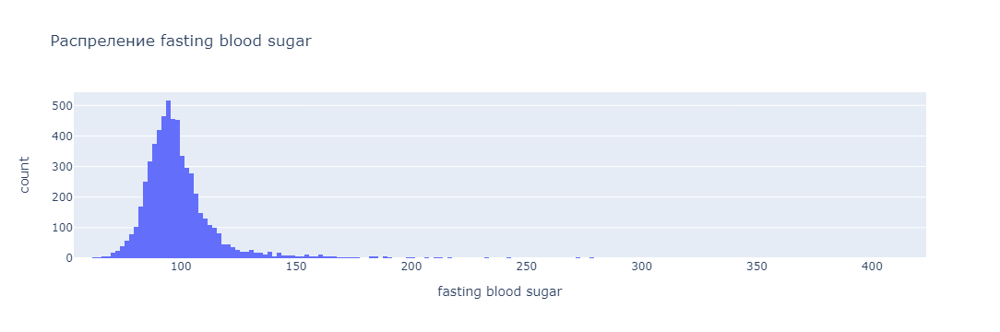

Количество строк с выбросами в столбце 'Cholesterol': 70


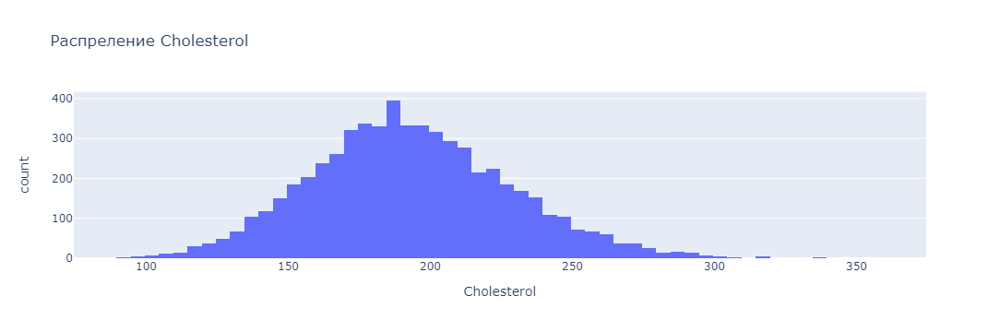

Количество строк с выбросами в столбце 'triglyceride': 235


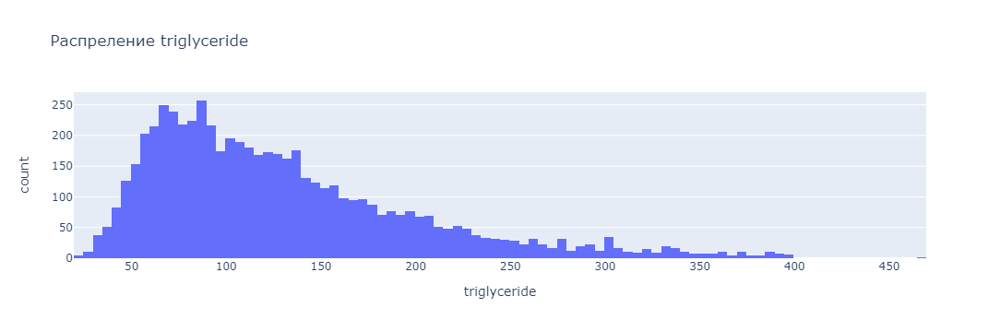

Количество строк с выбросами в столбце 'HDL': 126


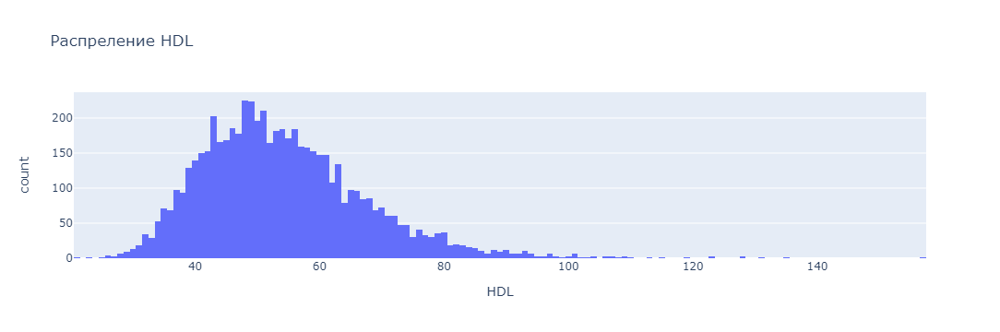

Количество строк с выбросами в столбце 'LDL': 52


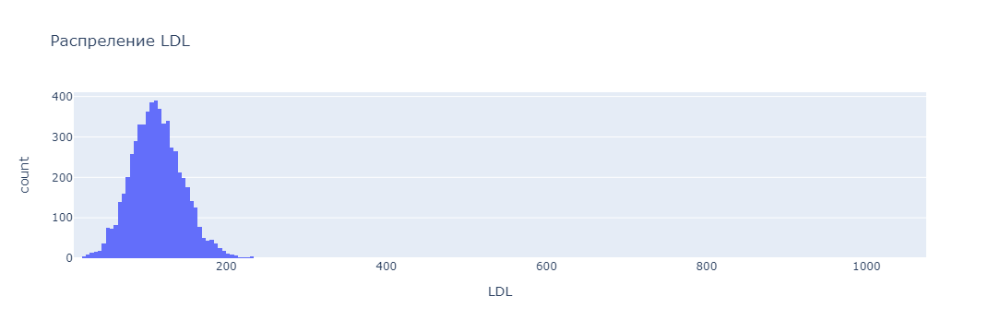

Количество строк с выбросами в столбце 'hemoglobin': 104


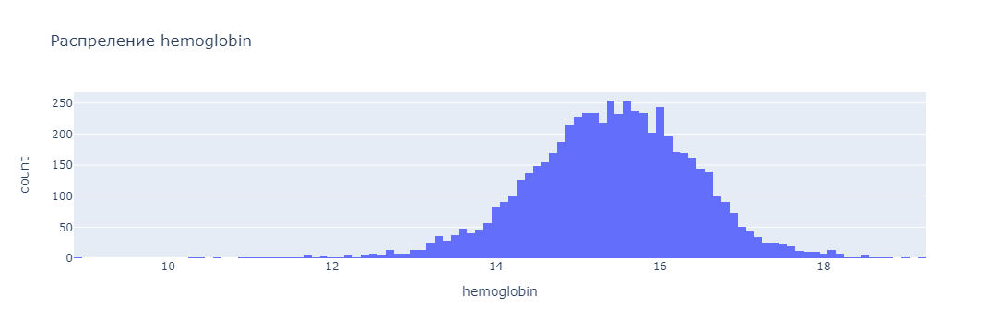

Количество строк с выбросами в столбце 'Urine protein': 349


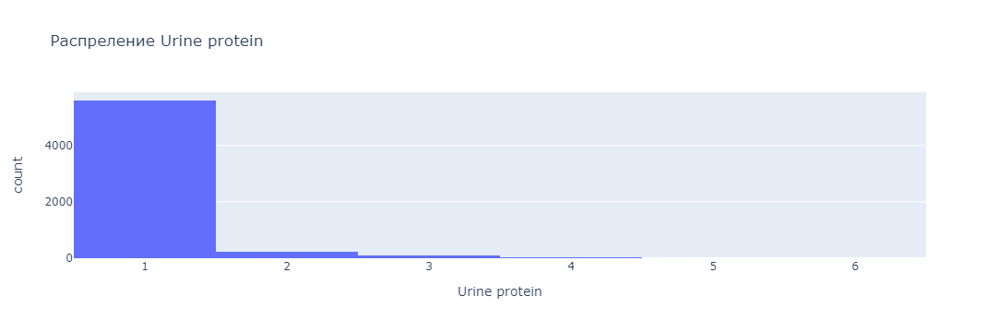

Количество строк с выбросами в столбце 'serum creatinine': 38


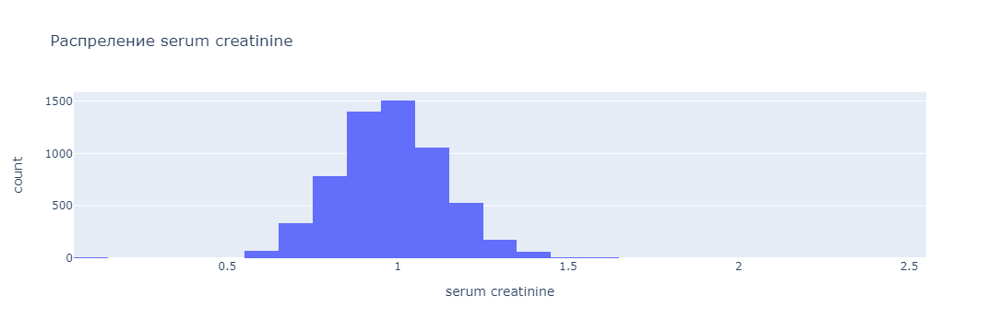

Количество строк с выбросами в столбце 'AST': 336


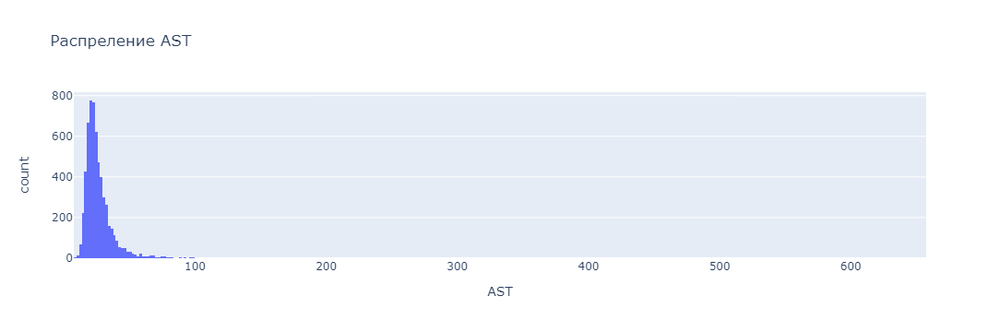

Количество строк с выбросами в столбце 'ALT': 372


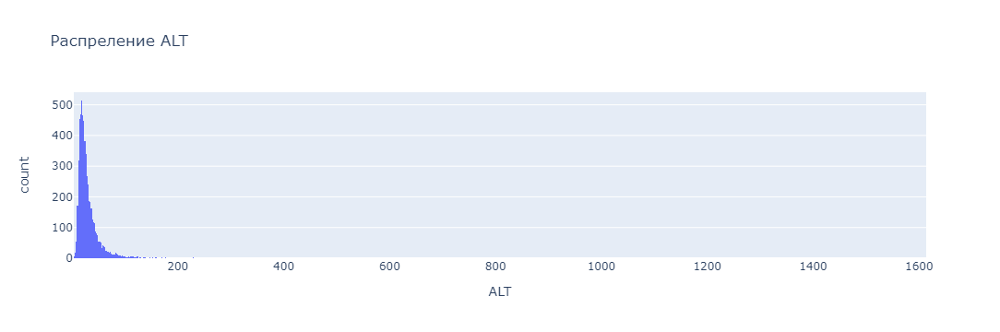

Количество строк с выбросами в столбце 'Gtp': 479


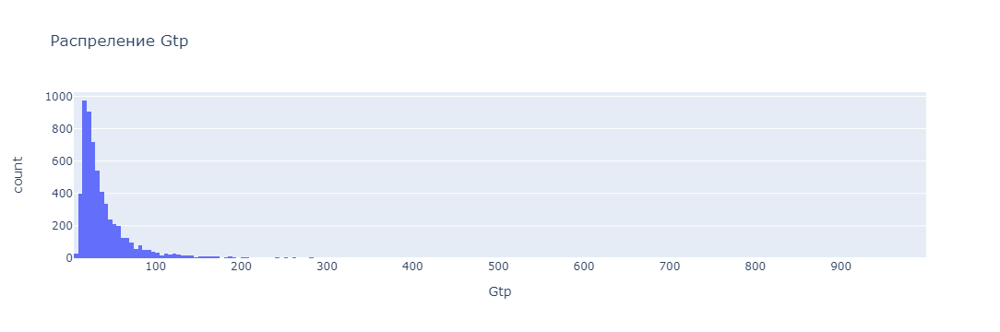

Количество уникальных значений в столбце 'oral': 1
Уникальные значения в столбце 'oral':
['Y']


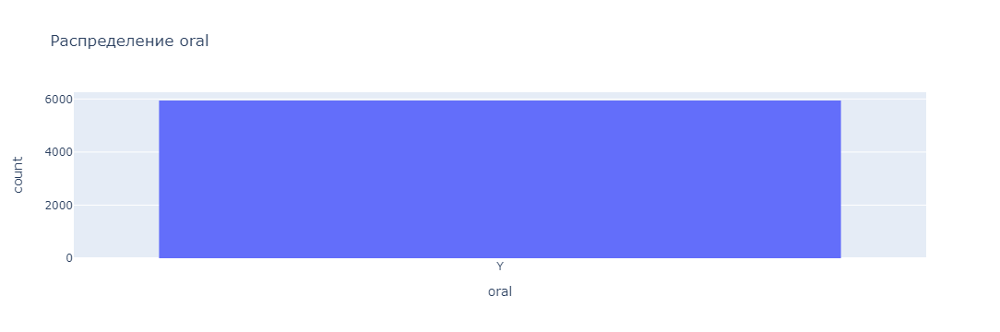

Количество строк с выбросами в столбце 'dental caries': 1289


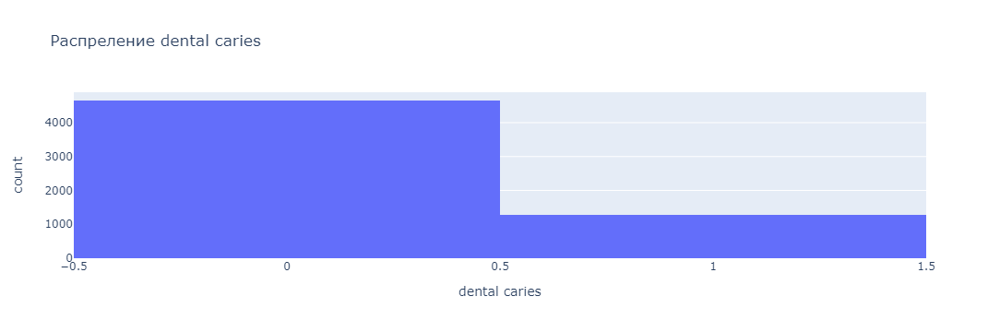

Количество уникальных значений в столбце 'tartar': 2
Уникальные значения в столбце 'tartar':
['Y' 'N']


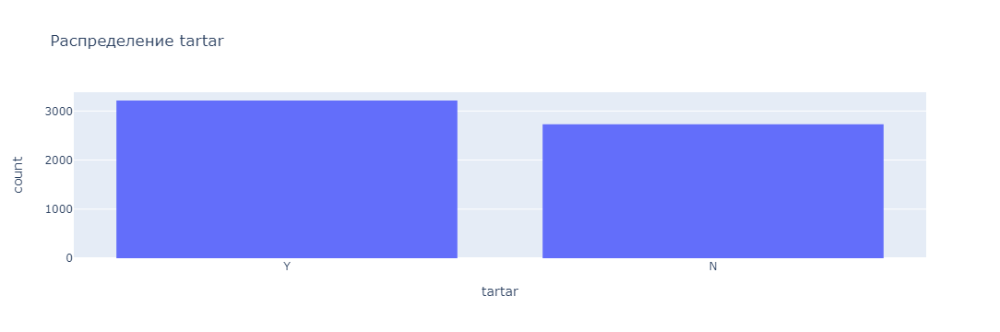

In [89]:
analyze_df(test)

Все распрледеления нормальные/логнормальные. Антропометрические данные и возраст а также  медицинские показатели распределены вокруг средних показателей которые являются нормой ( согласно данных ВОЗ) 

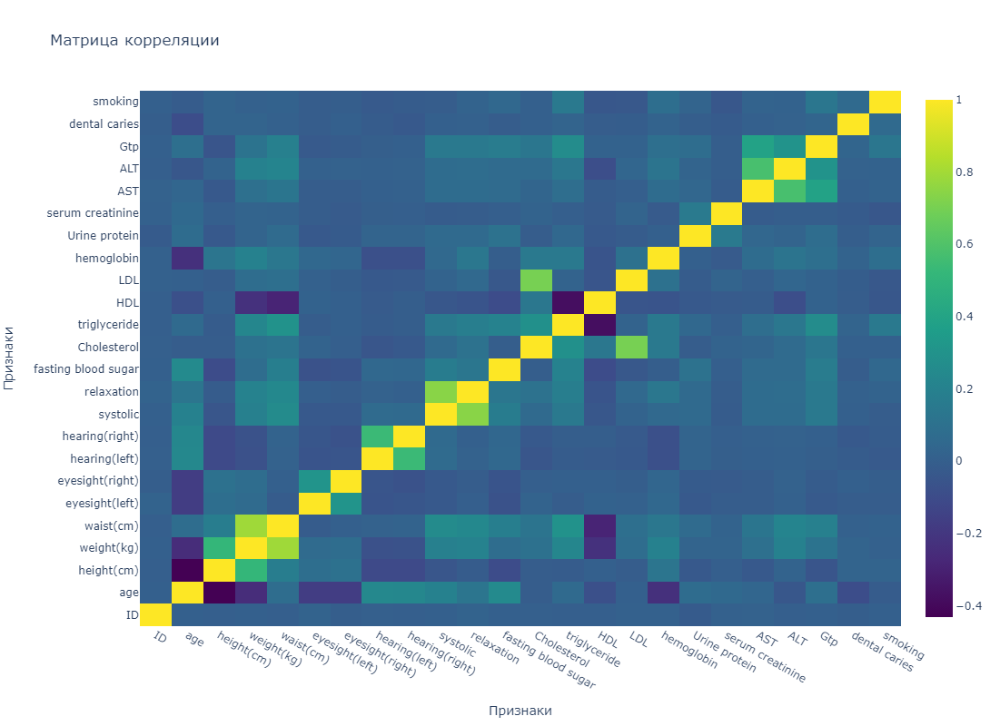

In [90]:
correlation_matrix = df.corr(numeric_only = True)

fig = go.Figure(data=go.Heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns,
    y=correlation_matrix.index,
    colorscale='Viridis',  
))


fig.update_layout(
    title='Матрица корреляции',
    xaxis_title='Признаки',
    yaxis_title='Признаки',
    width=1100,  
    height=800, 
)

fig.show()

interval columns not set, guessing: ['ID', 'age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)', 'eyesight(right)', 'hearing(left)', 'hearing(right)', 'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride', 'HDL', 'LDL', 'hemoglobin', 'Urine protein', 'serum creatinine', 'AST', 'ALT', 'Gtp', 'dental caries', 'smoking']


C:\Users\solov\anaconda3\Lib\site-packages\phik\data_quality.py:82: UserWarning:

Not enough unique value for variable oral for analysis 1. Dropping this column



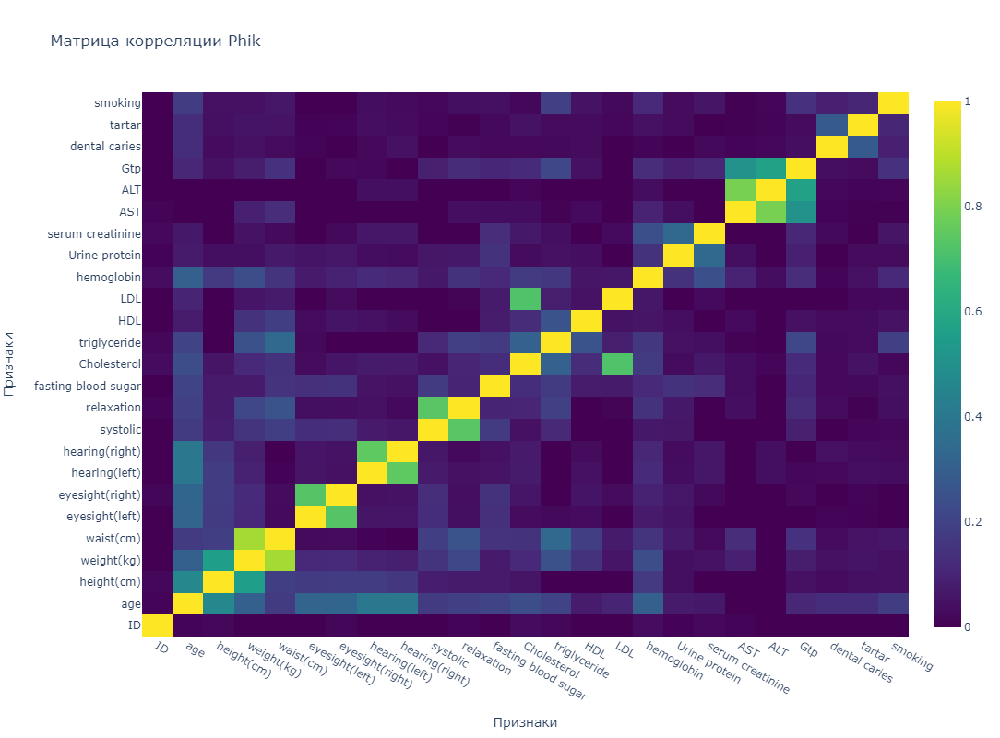

In [91]:
phik_matrix = df.phik_matrix()

fig = go.Figure(data=go.Heatmap(
    z=phik_matrix.values,
    x=phik_matrix.columns,
    y=phik_matrix.index,
    colorscale='Viridis',  
))


fig.update_layout(
    title='Матрица корреляции Phik',
    xaxis_title='Признаки',
    yaxis_title='Признаки',
    width=1100,  
    height=800, 
)

fig.show()

Целевой признак практически не коррелирут ни с одним другим признаком. Или связи более сложные. Некоторые признаки довольно сильно зависимы, например рост - вес (логично ), что касается медицинских признаков то коррелирующие показатели насколько я углубился - действительно могут быть зависимы.

In [92]:
df = df.drop([  'ID' ], axis = 1)

In [93]:
test = test.drop([  'ID' ], axis = 1)

id явно лишний

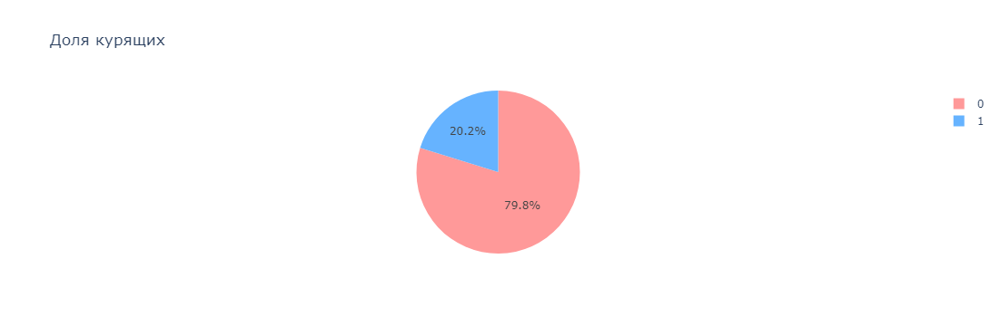

In [94]:
smoking_counts = df['smoking'].value_counts()
labels = smoking_counts.index
values = smoking_counts.values
fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='percent', marker_colors=['#ff9999', '#66b3ff'])])
fig.update_layout(title='Доля курящих')
fig.show()

Явный дисбаланс целевой 1/4, будем устанавливать автобаланс в моделях. 

In [95]:
X = df.drop(columns=['smoking'])  
y = df['smoking']

По итогам EDA: данные чистные, без аномалий, без пропусков, слабо коррелируют с целевой переменной. 

### 3. Подготовка данных.

In [96]:
num_features = X.select_dtypes(exclude=['object']).columns.tolist()
cat_features = X.select_dtypes(include=['object']).columns.tolist()

In [97]:
categorical_pipeline = Pipeline(steps=[
    ("encoder", OneHotEncoder(drop="first", sparse_output=False, handle_unknown="ignore"))
])

numeric_pipeline = Pipeline(steps=[
    ('scaler', MinMaxScaler())
])

data_transformer = ColumnTransformer(transformers=[
    ('numerical', numeric_pipeline, num_features),
    ('categorical', categorical_pipeline, cat_features)
])

preprocessor = Pipeline(steps=[
    ('data_transformer', data_transformer),
    ('polynomial_features', PolynomialFeatures(degree=2, interaction_only=True)),
    ('feature_selection', SelectFromModel(LGBMClassifier(n_estimators=3000, objective='binary', force_col_wise=True, class_weight='balanced'),
                                           threshold='0.5 * median'))
])

Стандартный контейнер: качественнные OHE, колличественные MixMax, генерация признаков 'polynomial_features', отбор по важноси SelectModel (LGBM) 

In [98]:
X = preprocessor.fit_transform(X,y)
X_test = preprocessor.transform(test)

[LightGBM] [Info] Number of positive: 2800, number of negative: 11063
[LightGBM] [Info] Total Bins 45441
[LightGBM] [Info] Number of data points in the train set: 13863, number of used features: 276
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


In [27]:
X.shape

(13863, 174)

In [28]:
RS = 42

In [29]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=RS, stratify=y)

### 4. ML

Подберем c помощью Optuna параметры для трех моделей LGBM, CatBoost и RandomForest

In [30]:
def objective_lgbm(trial):
    param = {
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1),
        'n_estimators': trial.suggest_int('n_estimators', 3000, 5000),
        'num_leaves': trial.suggest_int('num_leaves', 30, 100),
        'objective': 'binary',
        'class_weight': 'balanced',
        'min_child_samples': trial.suggest_int('min_child_samples', 1, 20),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 1e3, log=True),
        'random_state': RS,
        'force_col_wise': True,
        'eval_metric': 'f1',
        'early_stopping_rounds': 50,
        'verbose': -1
    }
    
    lgbm = LGBMClassifier(**param)

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=RS)
    cv_scores = cross_val_score(lgbm, X_train, y_train, cv=skf, scoring=make_scorer(f1_score),
                                fit_params={'eval_set': [(X_val, y_val)]},
                              )
    
    if trial.should_prune():
        raise optuna.TrialPruned()
    
    return cv_scores.mean()

In [31]:
study_lgbm = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler())
study_lgbm.optimize(objective_lgbm, n_trials=100)
best_params_lgbm = study_lgbm.best_params

[I 2024-06-10 20:51:07,946] A new study created in memory with name: no-name-9319d4de-46c5-4222-845c-5de93c552f5f
[I 2024-06-10 20:55:04,847] Trial 0 finished with value: 0.3880832752342249 and parameters: {'learning_rate': 0.02321527410134651, 'n_estimators': 3115, 'num_leaves': 57, 'min_child_samples': 8, 'subsample': 0.6964245672781382, 'reg_lambda': 129.1534636110752}. Best is trial 0 with value: 0.3880832752342249.
[I 2024-06-10 20:58:47,611] Trial 1 finished with value: 0.3809080633529486 and parameters: {'learning_rate': 0.022252791862611056, 'n_estimators': 4069, 'num_leaves': 68, 'min_child_samples': 6, 'subsample': 0.8191898044449303, 'reg_lambda': 87.05373653760768}. Best is trial 0 with value: 0.3880832752342249.
[I 2024-06-10 20:59:16,768] Trial 2 finished with value: 0.3505939773186716 and parameters: {'learning_rate': 0.06887233614306355, 'n_estimators': 4626, 'num_leaves': 86, 'min_child_samples': 10, 'subsample': 0.8822861923508324, 'reg_lambda': 0.36555400802478505}. 

In [35]:
def objective_rf(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 1000, 1500),
        'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy', 'log_loss']),
        'max_depth': trial.suggest_int('max_depth', 6, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None]),
        'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
        'class_weight': 'balanced',
        'random_state': RS
    }
    
    rf = RandomForestClassifier(**param)

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=RS)
    cv_scores = cross_val_score(rf, X_train, y_train, cv=skf, scoring=make_scorer(f1_score))

    if trial.should_prune():
        raise optuna.TrialPruned()
    
    return cv_scores.mean()

In [36]:
study_rf = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler())
study_rf.optimize(objective_rf, n_trials=100)
best_params_rf = study_rf.best_params

[I 2024-06-12 20:41:45,719] A new study created in memory with name: no-name-205de2b7-2e6a-4dc8-b9f5-1af02c926ff4
[I 2024-06-12 20:56:16,109] Trial 0 finished with value: 0.3785015129301522 and parameters: {'n_estimators': 1152, 'criterion': 'gini', 'max_depth': 19, 'min_samples_split': 18, 'min_samples_leaf': 11, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.3785015129301522.
[I 2024-06-12 22:56:15,903] Trial 1 finished with value: 0.39156444264563045 and parameters: {'n_estimators': 1016, 'criterion': 'entropy', 'max_depth': 13, 'min_samples_split': 5, 'min_samples_leaf': 18, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 0.39156444264563045.
[I 2024-06-12 23:06:45,593] Trial 2 finished with value: 0.40195054471181146 and parameters: {'n_estimators': 1212, 'criterion': 'entropy', 'max_depth': 9, 'min_samples_split': 12, 'min_samples_leaf': 15, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 2 with value: 0.4019505447118114

In [41]:
def objective_cb(trial):
    param = {
        'iterations': trial.suggest_int('iterations', 3000, 5000),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1),
        'depth': trial.suggest_int('depth', 4, 12),
        'loss_function': 'Logloss',
        'auto_class_weights': 'Balanced',
        'bootstrap_type': trial.suggest_categorical('bootstrap_type', ['Bayesian', 'Bernoulli']),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.1, 1.0),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 50),
        'random_state': RS,
        'verbose': False,
        'eval_metric': 'F1'
    }
    
    if param['bootstrap_type'] == 'Bayesian':
        param['bagging_temperature'] = trial.suggest_float('bagging_temperature', 1, 20)
    elif param['bootstrap_type'] == 'Bernoulli':
        param['subsample'] = trial.suggest_float('subsample', 0.1, 1)
    
    cb = CatBoostClassifier(**param)

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=RS)
    cv_scores = cross_val_score(
        cb, X_train, y_train, cv=skf, scoring=make_scorer(f1_score), fit_params={'eval_set': [(X_val, y_val)]})
    
    if trial.should_prune():
        raise optuna.TrialPruned()
    
    return cv_scores.mean()

In [42]:
study_cb = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler())
study_cb.optimize(objective_cb, n_trials=100)
best_params_cb = study_cb.best_params

[I 2024-06-14 16:40:44,590] A new study created in memory with name: no-name-41ccb069-92ac-4f88-990b-4c025610ae3e
[I 2024-06-14 18:43:20,771] Trial 0 finished with value: 0.4098444206330962 and parameters: {'iterations': 3192, 'learning_rate': 0.019130948282243144, 'depth': 11, 'bootstrap_type': 'Bernoulli', 'colsample_bylevel': 0.52668811349845, 'min_child_samples': 40, 'subsample': 0.870746246804048}. Best is trial 0 with value: 0.4098444206330962.
[I 2024-06-14 20:48:26,420] Trial 1 finished with value: 0.3973473687572254 and parameters: {'iterations': 3553, 'learning_rate': 0.0305263784923626, 'depth': 11, 'bootstrap_type': 'Bayesian', 'colsample_bylevel': 0.47585944425967186, 'min_child_samples': 29, 'bagging_temperature': 2.1276843975092152}. Best is trial 0 with value: 0.4098444206330962.
[I 2024-06-14 21:05:15,650] Trial 2 finished with value: 0.399595186647934 and parameters: {'iterations': 3976, 'learning_rate': 0.049002106141664406, 'depth': 7, 'bootstrap_type': 'Bayesian', 

In [43]:
best_lgbm_params = {
    'learning_rate': best_params_lgbm['learning_rate'],
    'n_estimators': best_params_lgbm['n_estimators'],
    'num_leaves': best_params_lgbm['num_leaves'],
    'objective': 'binary',
    'class_weight': 'balanced',
    'min_child_samples': best_params_lgbm['min_child_samples'],
    'subsample': best_params_lgbm['subsample'],
    'reg_lambda': best_params_lgbm['reg_lambda'],
    'random_state': RS,
    'force_col_wise': True,
    'verbose': -1
}

Будем использовать ансамбль с мягким голосованием VotingClassifier для наших моделей с уже подобранными параметрыми.

In [45]:
estimators = [
    ('lgbm', LGBMClassifier(**best_lgbm_params)),
    ('rf', RandomForestClassifier(**best_params_rf)),
    ('cb', CatBoostClassifier(**best_params_cb))
]

In [46]:
voting_clf = VotingClassifier(
    estimators=estimators,
    voting='soft'
)

In [51]:
voting_clf.fit(X_train, y_train)
y_val_proba = voting_clf.predict_proba(X_val)[:, 1]

0:	learn: 0.6853371	total: 11ms	remaining: 41.8s
1:	learn: 0.6780856	total: 22.5ms	remaining: 42.8s
2:	learn: 0.6709863	total: 36.5ms	remaining: 46.4s
3:	learn: 0.6644189	total: 47.7ms	remaining: 45.5s
4:	learn: 0.6581236	total: 58.1ms	remaining: 44.3s
5:	learn: 0.6516268	total: 70.5ms	remaining: 44.8s
6:	learn: 0.6459986	total: 82.5ms	remaining: 44.9s
7:	learn: 0.6401556	total: 94.3ms	remaining: 44.9s
8:	learn: 0.6343484	total: 107ms	remaining: 45.3s
9:	learn: 0.6289270	total: 119ms	remaining: 45.3s
10:	learn: 0.6235420	total: 130ms	remaining: 45.1s
11:	learn: 0.6184846	total: 143ms	remaining: 45.4s
12:	learn: 0.6136875	total: 155ms	remaining: 45.3s
13:	learn: 0.6093726	total: 168ms	remaining: 45.7s
14:	learn: 0.6048277	total: 184ms	remaining: 46.5s
15:	learn: 0.6004246	total: 197ms	remaining: 46.7s
16:	learn: 0.5960504	total: 211ms	remaining: 47.2s
17:	learn: 0.5919818	total: 223ms	remaining: 47.1s
18:	learn: 0.5881470	total: 237ms	remaining: 47.3s
19:	learn: 0.5847806	total: 251ms	r

Тепеперь подберем оптимальнй порог

In [66]:
def objective(trial):
    threshold = trial.suggest_float('threshold', 0.05, 0.99)
    y_pred = (y_val_proba >= threshold).astype(int)
    return f1_score(y_val, y_pred)

In [68]:
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler())
study.optimize(objective, n_trials=1000)
best_threshold = study.best_params['threshold']
best_f1 = study.best_value

[I 2024-06-16 11:08:16,677] A new study created in memory with name: no-name-063bc6a4-9a47-476c-9fe6-f6afe7c2c0d3
[I 2024-06-16 11:08:16,685] Trial 0 finished with value: 0.07457627118644068 and parameters: {'threshold': 0.6623657495579139}. Best is trial 0 with value: 0.07457627118644068.
[I 2024-06-16 11:08:16,692] Trial 1 finished with value: 0.4642593957258659 and parameters: {'threshold': 0.3365375783411538}. Best is trial 1 with value: 0.4642593957258659.
[I 2024-06-16 11:08:16,698] Trial 2 finished with value: 0.29521276595744683 and parameters: {'threshold': 0.5096579181548306}. Best is trial 1 with value: 0.4642593957258659.
[I 2024-06-16 11:08:16,709] Trial 3 finished with value: 0.36436436436436437 and parameters: {'threshold': 0.12072205306966001}. Best is trial 1 with value: 0.4642593957258659.
[I 2024-06-16 11:08:16,716] Trial 4 finished with value: 0.35215736040609136 and parameters: {'threshold': 0.10034922447798279}. Best is trial 1 with value: 0.4642593957258659.
[I 2

In [69]:
print(f"Лучший порог: {best_threshold}")
print(f"Лучшая F1 оценка: {best_f1}")

Лучший порог: 0.3293266304356744
Лучшая F1 оценка: 0.47134670487106023


### 5. Анализ результатов

In [70]:
y_val_pred = (y_val_proba >= best_threshold).astype(int)
print("Classification Report:")
print(classification_report(y_val, y_val_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.77      0.82      2213
           1       0.39      0.59      0.47       560

    accuracy                           0.73      2773
   macro avg       0.64      0.68      0.65      2773
weighted avg       0.78      0.73      0.75      2773



Модель имеет общую точность 0.73. Это неплохой результат.
Macro avg: Среднее арифметическое метрик для каждого класса, не взвешенное по количеству примеров в классах. Значения precision, recall и f1-score для macro avg составляют 0.64, 0.68 и 0.65 соответственно.
Weighted avg: Среднее взвешенное метрик для каждого класса, взвешенное по количеству примеров в каждом классе. Значения precision, recall и f1-score для weighted avg составляют 0.78, 0.73 и 0.75 соответственно. Это дает лучшее представление о производительности модели на всем наборе данных, учитывая дисбаланс классов.
Производительность по классам
Класс 0:
Precision (Точность): 0.88.
Recall (Полнота): 0.77.
F1-score: 0.82.
Класс 1:
Precision (Точность): 0.39 - довольно низкая. 
Recall (Полнота): 0.59, модель правильно идентифицирует только 59% всех настоящих примеров класса 1.
F1-score: 0.47. Довольно низкая производительность для этого класса.

### 6. Тест с лучшим порогом и сохранения предсказаний. 

In [99]:
voting_clf.fit(X, y)

test_proba = voting_clf.predict_proba(X_test)[:, 1]
test_predictions = (test_proba >= best_threshold).astype(int)
print('Предсказания на тестовом наборе данных:', test_predictions)

0:	learn: 0.6858191	total: 15.6ms	remaining: 59.4s
1:	learn: 0.6786338	total: 31.1ms	remaining: 59.3s
2:	learn: 0.6716089	total: 46.6ms	remaining: 59.2s
3:	learn: 0.6647667	total: 62.4ms	remaining: 59.5s
4:	learn: 0.6582012	total: 77.7ms	remaining: 59.2s
5:	learn: 0.6519930	total: 92.2ms	remaining: 58.6s
6:	learn: 0.6457876	total: 108ms	remaining: 58.7s
7:	learn: 0.6398696	total: 124ms	remaining: 59.2s
8:	learn: 0.6341283	total: 142ms	remaining: 1m
9:	learn: 0.6288781	total: 157ms	remaining: 59.9s
10:	learn: 0.6235801	total: 173ms	remaining: 59.8s
11:	learn: 0.6184340	total: 188ms	remaining: 59.5s
12:	learn: 0.6136016	total: 203ms	remaining: 59.5s
13:	learn: 0.6087893	total: 218ms	remaining: 59.1s
14:	learn: 0.6045478	total: 234ms	remaining: 59.3s
15:	learn: 0.6001895	total: 253ms	remaining: 1m
16:	learn: 0.5958891	total: 274ms	remaining: 1m 1s
17:	learn: 0.5919380	total: 291ms	remaining: 1m 1s
18:	learn: 0.5878609	total: 308ms	remaining: 1m 1s
19:	learn: 0.5838712	total: 325ms	remaini

In [100]:
test = pd.read_csv('data/test.csv')

In [101]:
test['smoking'] = test_predictions

In [102]:
test[['ID', 'smoking']].to_csv('pred.csv', index= False)

##### Вывод: мы решали задачу определения курящих людей по медицинским показаниям. Данные были предоставленные качественные, но как показал результат не очень релевантные. Точно определить курит человек или нет по этом набору признаков - нельзя. Возможно использование другие показателей например рентгеновских снимков легких или более расширенного анализа крови - дали бы лучший результат. Так же существуют анализы на никотин и его производные , которые сразу дадут более качественные результаты. 

Итоговый F1 на тесте: 0.442